In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
GDB_FILE = r"input_data/lion/lion.gdb"

In [5]:

lion_gdf = gpd.read_file(GDB_FILE, engine='pyogrio', layer='lion')

In [70]:
for col in lion_gdf.columns:
    print(col)

Street
SAFStreetName
FeatureTyp
SegmentTyp
IncExFlag
RB_Layer
NonPed
TrafDir
TrafSrc
SpecAddr
FaceCode
SeqNum
StreetCode
SAFStreetCode
LGC1
LGC2
LGC3
LGC4
LGC5
LGC6
LGC7
LGC8
LGC9
BOE_LGC
SegmentID
SegCount
LocStatus
LZip
RZip
LBoro
RBoro
L_CD
R_CD
LATOMICPOLYGON
RATOMICPOLYGON
LCT2010
LCT2010Suf
RCT2010
RCT2010Suf
LCB2010
LCB2010Suf
RCB2010
RCB2010Suf
LCT2000
LCT2000Suf
RCT2000
RCT2000Suf
LCB2000
LCB2000Suf
RCB2000
RCB2000Suf
LCT1990
LCT1990Suf
RCT1990
RCT1990Suf
LAssmDist
LElectDist
RAssmDist
RElectDist
SplitElect
LSchlDist
RSchlDist
SplitSchl
LSubSect
RSubSect
SanDistInd
MapFrom
MapTo
BoroBndry
MH_RI_Flag
XFrom
YFrom
XTo
YTo
ArcCenterX
ArcCenterY
CurveFlag
Radius
NodeIDFrom
NodeIDTo
NodeLevelF
NodeLevelT
ConParity
Twisted
RW_TYPE
PhysicalID
GenericID
NYPDID
FDNYID
LBlockFaceID
RBlockFaceID
LegacyID
Status
StreetWidth_Min
StreetWidth_Max
StreetWidth_Irr
BikeLane
BIKE_TRAFDIR
ACTIVE_FLAG
POSTED_SPEED
Snow_Priority
Number_Travel_Lanes
Number_Park_Lanes
Number_Total_Lanes
Carto_Display_

In [28]:
# filtered_lion = lion_gdf[lion_gdf['SegmentTyp'] == 'B'].copy()
filtered_lion = lion_gdf.copy()
filtered_lion = filtered_lion[(filtered_lion['LBoro'] == 1) & (filtered_lion['RBoro'] == 1)]

In [29]:
filtered_lion['Latitude'] = filtered_lion.geometry.centroid.y
filtered_lion['Longitude'] = filtered_lion.geometry.centroid.x

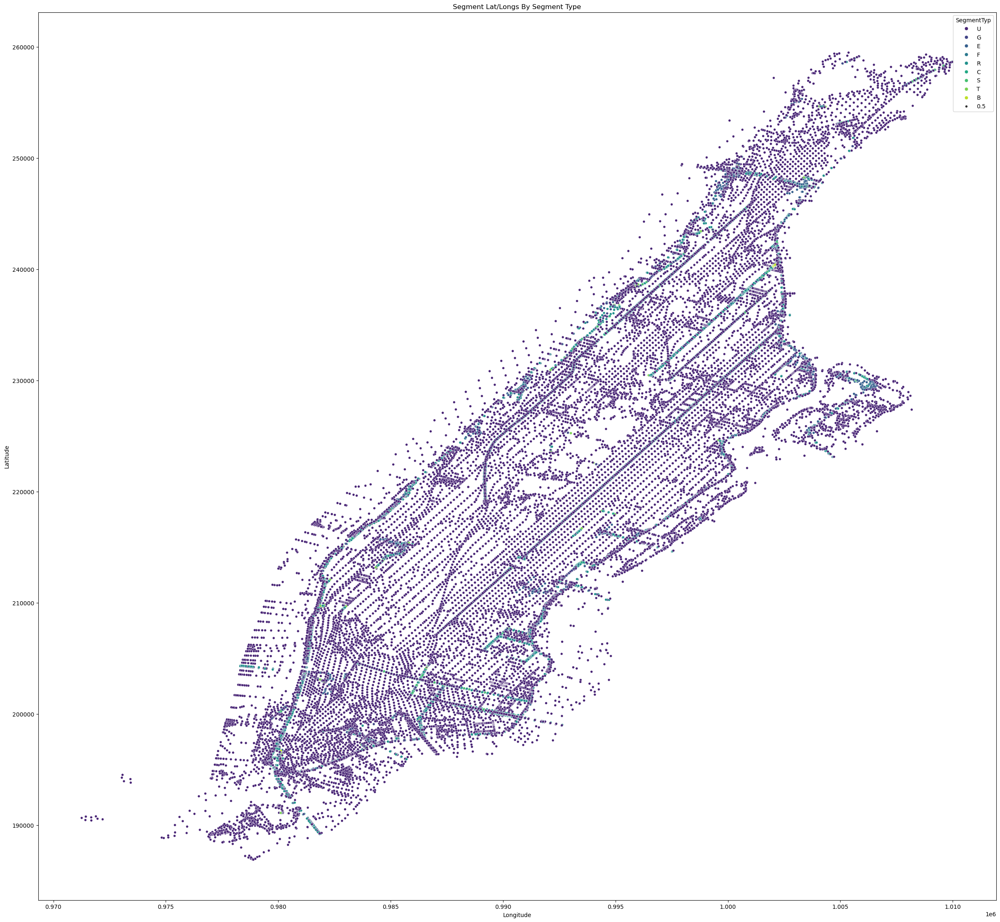

In [43]:

plt.figure(figsize=(30, 28))
sns.scatterplot(data=filtered_lion, x='Longitude', y='Latitude', hue='SegmentTyp', size=0.5, palette='viridis', legend=True)
plt.title('Segment Lat/Longs By Segment Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

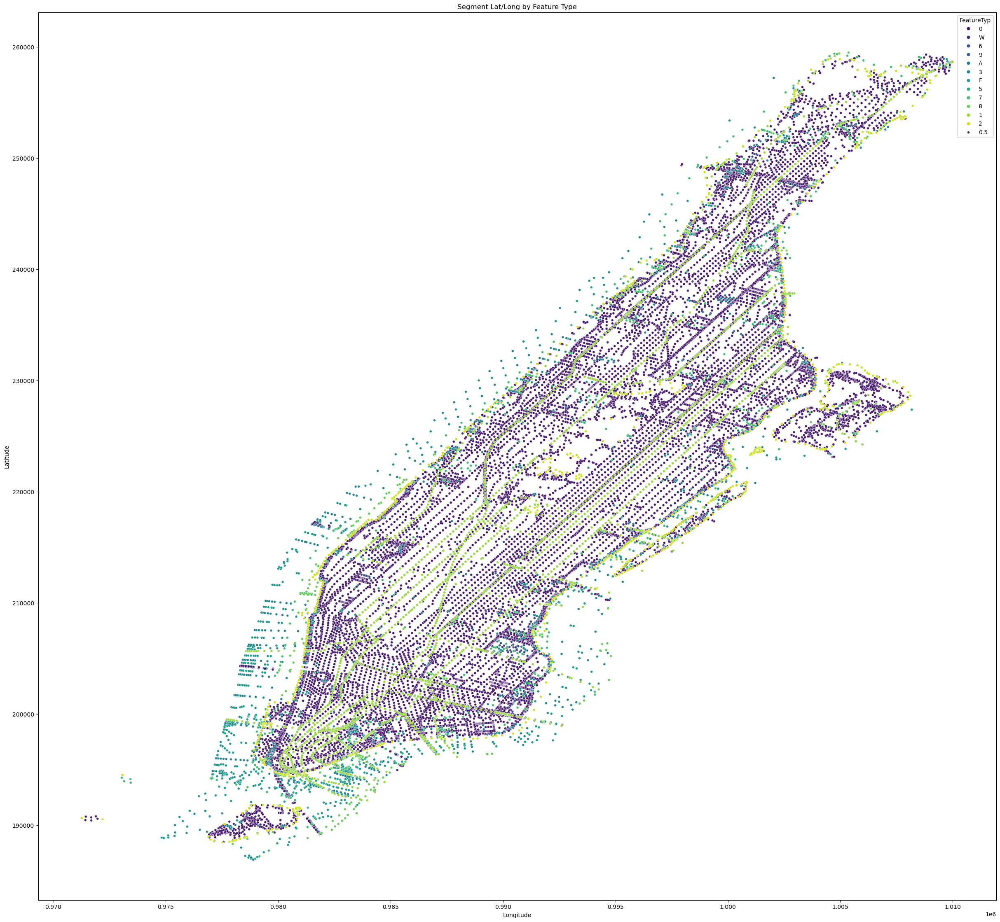

In [44]:
plt.figure(figsize=(30, 28))
sns.scatterplot(data=filtered_lion, x='Longitude', y='Latitude', hue='FeatureTyp', size=0.5, palette='viridis', legend=True)
plt.title('Segment Lat/Long by Feature Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

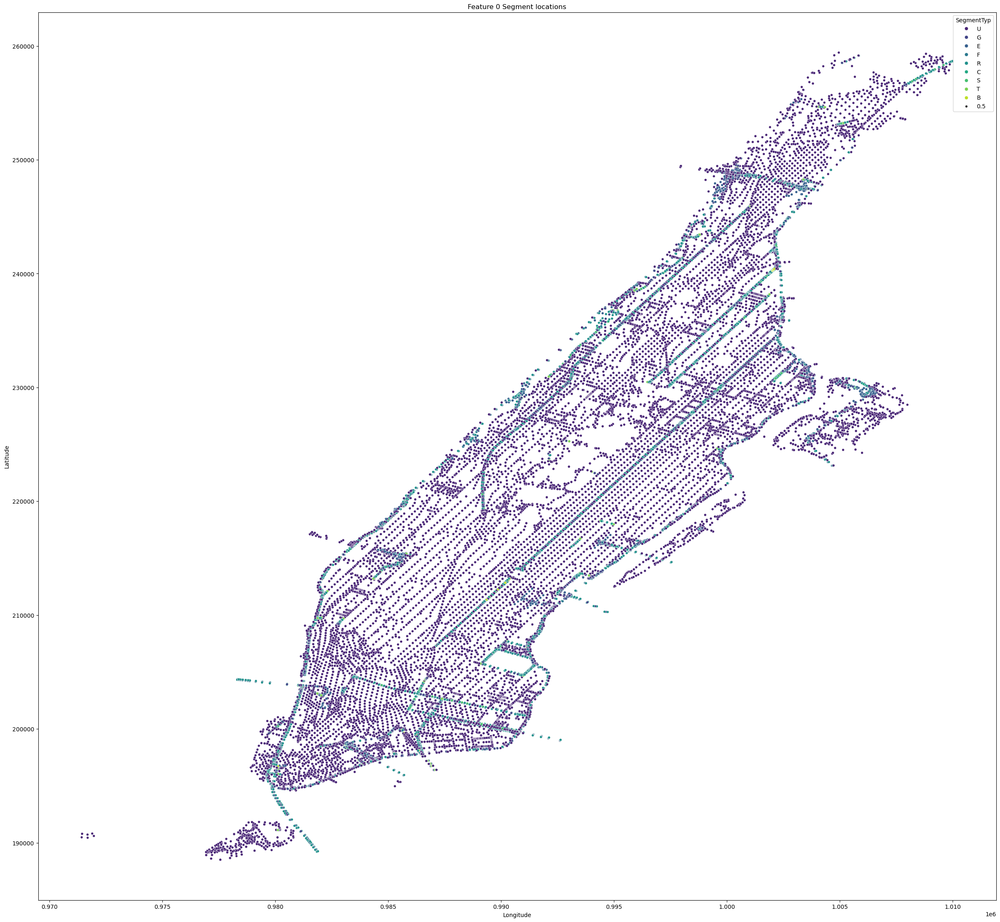

In [47]:
# 0 = Street other than vehicle only street.
# 1 = Railroad
# 2 = Water Edge / Shoreline
# 3 = Census Block Boundary
# 5 = Paper street. common in areas of Staten Island anticipating development. May exist in all boroughs.
# 6 = Private Street: This is a physically existing street which is not owned by the City and is not officially mapped. For example, streets in the Fort Totten and Breezy Point sections of Queens
# 7  = District Boundary: Physically non-existent boundary for a community district, a police precinct, or a fire company
# 8 = Physical Non-Street Boundary: Physically existing un-addressable boundary (such as a rock wall cemetery edge).
# 9 = Paper Street and Census/District Boundary: A legally mapped, but unbuilt street that also acts as a census block or district boundary
# A = Alley: a narrow street or passageway between and behind city buildings.
# W = Path, Non-Vehicular, Addressable: This is a walking path that contains addresses. For example, some boardwalks and some walking paths in housing projects
# F = Ferry Route: A schematic representation of a ferry’s passage through a water

feature_0_lion = filtered_lion[filtered_lion['FeatureTyp'] == '0']
plt.figure(figsize=(30, 28))
sns.scatterplot(data=feature_0_lion, x='Longitude', y='Latitude', hue='SegmentTyp', size=0.5, palette='viridis', legend=True)
plt.title('Feature 0 Segment locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

/var/folders/k2/s9j0wvg542n0d4_0n5lwnp140000gn/T/ipykernel_86417/4016318042.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=feature_0_segment_u_lion, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)


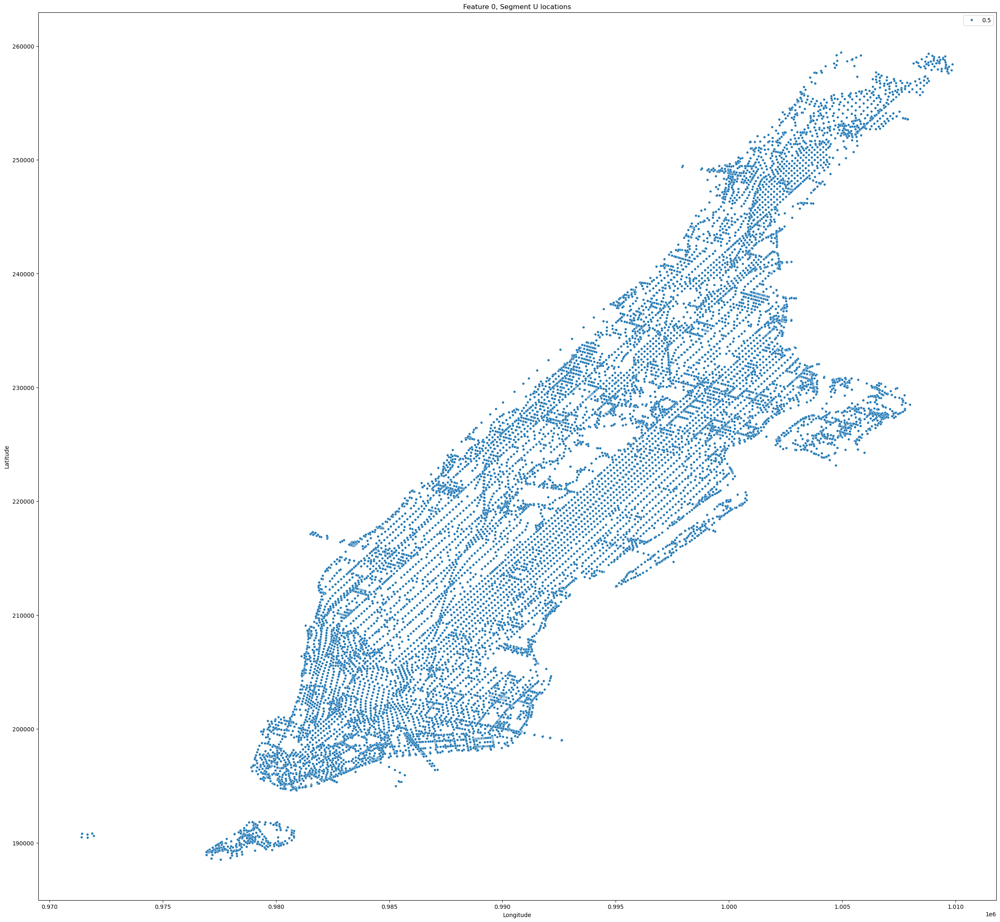

In [48]:
feature_0_segment_u_lion = filtered_lion[(filtered_lion['FeatureTyp'] == '0') & (filtered_lion['SegmentTyp'] == 'U')]
plt.figure(figsize=(30, 28))
sns.scatterplot(data=feature_0_segment_u_lion, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)
plt.title('Feature 0, Segment U locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

/var/folders/k2/s9j0wvg542n0d4_0n5lwnp140000gn/T/ipykernel_86417/3694702950.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=pedestrian_only, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)


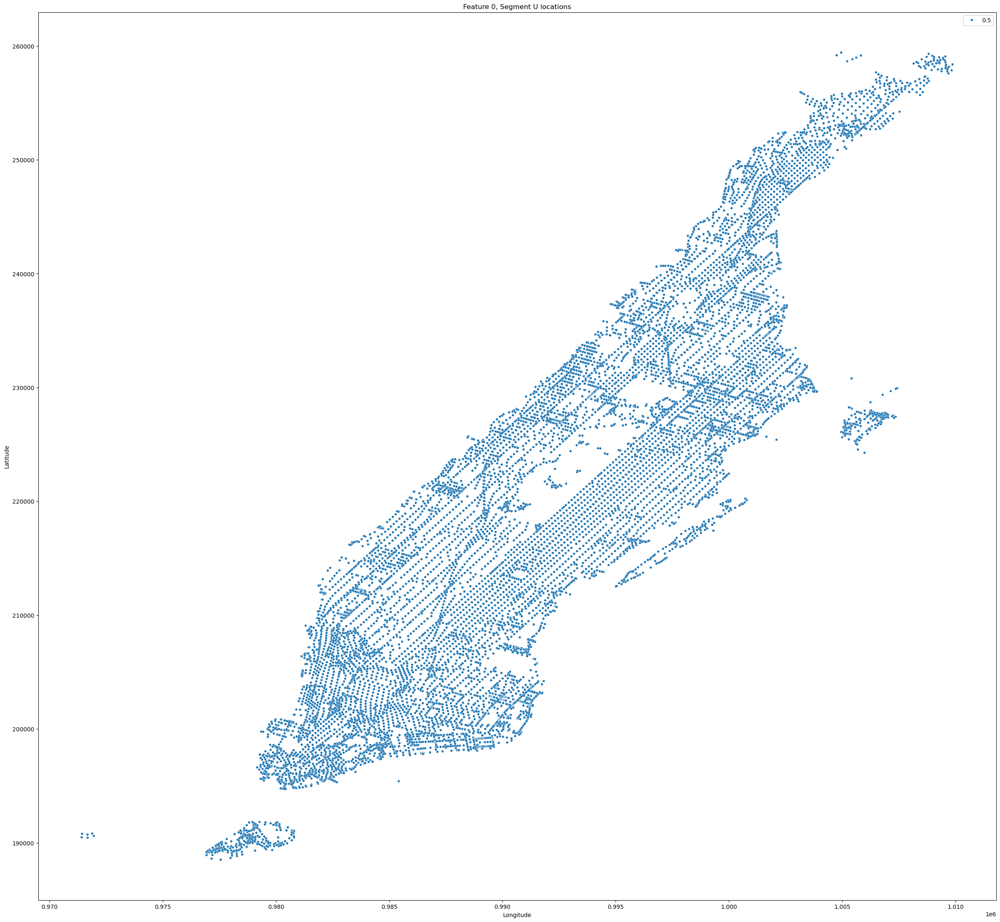

In [52]:
pedestrian_only = feature_0_segment_u_lion[(feature_0_segment_u_lion['NonPed'] != 'D') & (feature_0_segment_u_lion['NonPed'] != 'V')]
plt.figure(figsize=(30, 28))
sns.scatterplot(data=pedestrian_only, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)
plt.title('Feature 0, Segment U locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [64]:
pedestrian_only[pedestrian_only['SegCount'] != '0']['SegmentID']
pedestrian_only[pedestrian_only['SegmentID'] == '0018123']
# Multiple segments will just have the same segment id so thats no big deal

,Street,SAFStreetName,FeatureTyp,SegmentTyp,IncExFlag,RB_Layer,NonPed,TrafDir,TrafSrc,SpecAddr,...,RHi_Hyphen,FromLeft,ToLeft,FromRight,ToRight,Join_ID,SHAPE_Length,geometry,Latitude,Longitude
86944,BATTERY PLACE,,0,U,,B,,T,DOT,,...,63,50,64,51,63,1063501000000,262.777812,"MULTILINESTRING ((979278.645 196555.536, 97929...",196679.243767,979321.734734
86945,BATTERY PLACE,PS 94,0,U,,B,,T,DOT,N,...,None,0,0,0,0,10001101000000N,262.777812,"MULTILINESTRING ((979278.645 196555.536, 97929...",196679.243767,979321.734734


In [66]:
pedestrian_only = pedestrian_only.drop_duplicates(subset=['SegmentID'])

/var/folders/k2/s9j0wvg542n0d4_0n5lwnp140000gn/T/ipykernel_86417/2202970839.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=pedestrian_only, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)


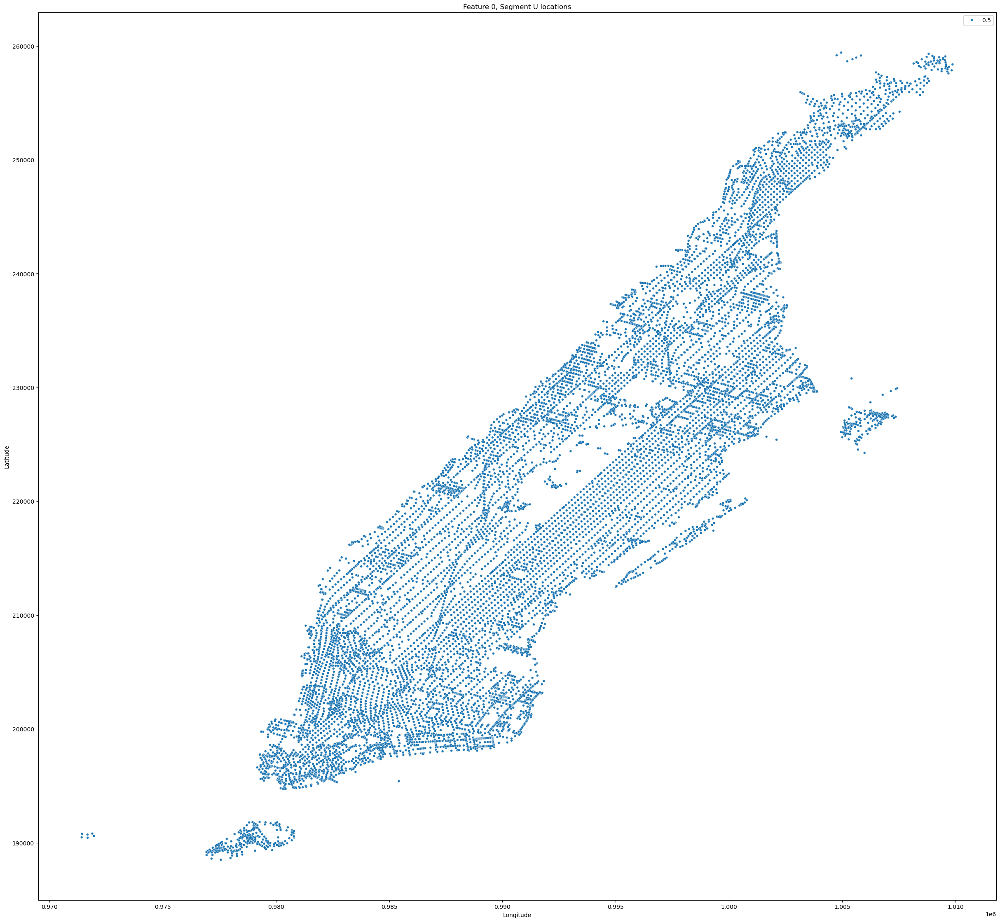

In [67]:
plt.figure(figsize=(30, 28))
sns.scatterplot(data=pedestrian_only, x='Longitude', y='Latitude', size=0.5, palette='viridis', legend=True)
plt.title('Feature 0, Segment U locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [ ]:
pedestrian_only = pedestrian_only[['Street', 'SegmentID', 'FeatureTyp', 'SegmentTyp', 'NonPed', 'LZip', 'XFrom', 'YFrom', 'XTo', 'YTo', 'ArcCenterX', 'ArcCenterY', 'Status', 'StreetWidth_Min', 'StreetWidth_Max', 'FromLeft', 'ToLeft', 'FromRight', 'ToRight', 'geometry']]

In [69]:
final_lion_data = f"output/filtered-lion.gpd"
pedestrian_only.to_file(final_lion_data)
print(f"Lion data saved: {final_lion_data}")

/var/folders/k2/s9j0wvg542n0d4_0n5lwnp140000gn/T/ipykernel_86417/2521449914.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  pedestrian_only.to_file(final_lion_data)


Lion data saved: output/filtered-lion.gpd
